In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

In [ ]:
%cd /content/gdrive/My Drive/FYP

# Face Parsing

## Segment out makeup


In [ ]:
os.chdir("face_makeup_PyTorch")

In [ ]:
import torch
import os
from model import BiSeNet
import os.path as osp
import numpy as np
from PIL import Image
import torchvision.transforms as transforms
import cv2


def vis_parsing_maps(im, parsing_anno, stride, save_im=False, save_path='vis_results/parsing_map_on_im.jpg'):
    # Colors for all 20 parts
    part_colors = [[255, 0, 0], [255, 85, 0], [255, 170, 0],
                   [255, 0, 85], [255, 0, 170],
                   [0, 255, 0], [85, 255, 0], [170, 255, 0],
                   [0, 255, 85], [0, 255, 170],
                   [0, 0, 255], [85, 0, 255], [170, 0, 255],
                   [0, 85, 255], [0, 170, 255],
                   [255, 255, 0], [255, 255, 85], [255, 255, 170],
                   [255, 0, 255], [255, 85, 255], [255, 170, 255],
                   [0, 255, 255], [85, 255, 255], [170, 255, 255]]

    im = np.array(im)
    vis_im = im.copy().astype(np.uint8)
    vis_parsing_anno = parsing_anno.copy().astype(np.uint8)
    vis_parsing_anno = cv2.resize(vis_parsing_anno, None, fx=stride, fy=stride, interpolation=cv2.INTER_NEAREST)
    vis_parsing_anno_color = np.zeros((vis_parsing_anno.shape[0], vis_parsing_anno.shape[1], 3)) + 255

    num_of_class = np.max(vis_parsing_anno)

    for pi in range(1, num_of_class + 1):
        index = np.where(vis_parsing_anno == pi)
        vis_parsing_anno_color[index[0], index[1], :] = part_colors[pi]

    vis_parsing_anno_color = vis_parsing_anno_color.astype(np.uint8)
    # print(vis_parsing_anno_color.shape, vis_im.shape)
    vis_im = cv2.addWeighted(cv2.cvtColor(vis_im, cv2.COLOR_RGB2BGR), 0.4, vis_parsing_anno_color, 0.6, 0)

    # Save result or not
    if save_im:
        cv2.imwrite(save_path[:-4] +'.png', vis_parsing_anno)
        cv2.imwrite(save_path, vis_im, [int(cv2.IMWRITE_JPEG_QUALITY), 100])
    return vis_parsing_anno
    # return vis_im


def evaluate(image_path='./imgs/116.jpg', cp='cp/79999_iter.pth'):

    # if not os.path.exists(respth):
    #     os.makedirs(respth)

    n_classes = 19
    net = BiSeNet(n_classes=n_classes)
    net.cuda()
    net.load_state_dict(torch.load(cp))
    net.eval()

    to_tensor = transforms.Compose([
        transforms.ToTensor(),
        transforms.Normalize((0.485, 0.456, 0.406), (0.229, 0.224, 0.225)),
    ])

    with torch.no_grad():
        img = Image.open(image_path).convert('RGB')
        #image = img.resize((512, 512), Image.BILINEAR)
        image = img
        img = to_tensor(image)
        img = torch.unsqueeze(img, 0)
        img = img.cuda()
        out = net(img)[0]
        parsing = out.squeeze(0).cpu().numpy().argmax(0)
        # print(parsing)
        # print(np.unique(parsing))

        # vis_parsing_maps(image, parsing, stride=1, save_im=False, save_path=osp.join(respth, dspth))
        return parsing

In [ ]:
import cv2
import os
import numpy as np
from skimage.filters import gaussian
#from test import evaluate
import argparse
from google.colab.patches import cv2_imshow

def sharpen(img):
    img = img * 1.0
    gauss_out = gaussian(img, sigma=5, multichannel=True)

    alpha = 1.5
    img_out = (img - gauss_out) * alpha + img

    img_out = img_out / 255.0

    mask_1 = img_out < 0
    mask_2 = img_out > 1

    img_out = img_out * (1 - mask_1)
    img_out = img_out * (1 - mask_2) + mask_2
    img_out = np.clip(img_out, 0, 1)
    img_out = img_out * 255
    return np.array(img_out, dtype=np.uint8)


def hair(image, parsing, part=17, color=[230, 50, 20]):
    b, g, r = color      #[10, 50, 250]       # [10, 250, 10]
    tar_color = np.zeros_like(image)
    tar_color[:, :, 0] = b
    tar_color[:, :, 1] = g
    tar_color[:, :, 2] = r

    image_hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    tar_hsv = cv2.cvtColor(tar_color, cv2.COLOR_BGR2HSV)

    if part == 12 or part == 13:
        image_hsv[:, :, 0:2] = tar_hsv[:, :, 0:2]
    else:
        image_hsv[:, :, 0:1] = tar_hsv[:, :, 0:1]

    changed = cv2.cvtColor(image_hsv, cv2.COLOR_HSV2BGR)

    if part == 17:
        changed = sharpen(changed)

    changed[parsing != part] = image[parsing != part]
    return changed


In [ ]:
os.listdir("..")

['t1.jpg',
 'facetools',
 'face-parsing.PyTorch',
 'colour_transfer',
 '=2.0.1',
 'fcn_pytorch.ipynb',
 'segmented face',
 'original face',
 'face_makeup_PyTorch',
 'result',
 'FYP Interim Report.gdoc',
 'girl15.csv',
 'out.png',
 'girl21.csv',
 'girl_3.csv',
 'girl.csv',
 'Full.ipynb',
 'source',
 'target',
 'result_one_dimensional',
 'result_N_dimensional',
 'FYP REPORT',
 'report',
 'Final Colour Transfer.ipynb',
 'output2.png',
 'result_lips',
 'original face OpenFace',
 'result_eyebrows',
 'result_eyes',
 'results_skin',
 'result_face',
 'chapter4.drawio',
 'Untitled Diagram.drawio',
 'Hair Color Transfer Unsegmented.ipynb',
 'Lips Color Transfer Unsegmented.ipynb']

## SKIN TARGET

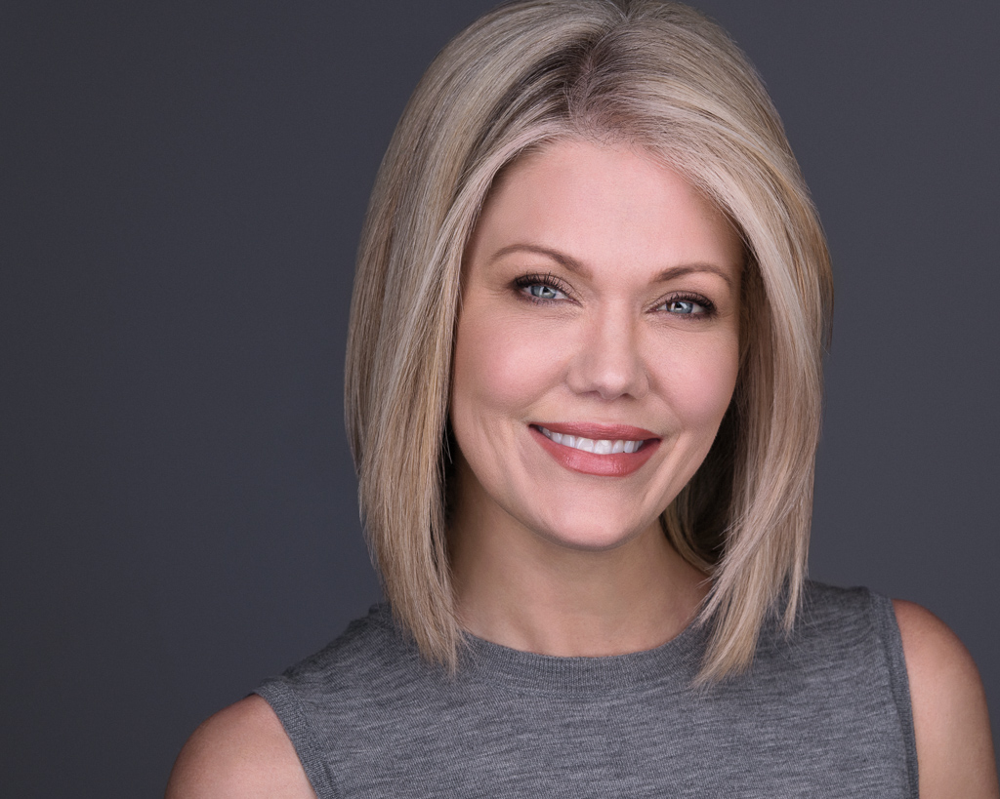

In [ ]:
from PIL import Image
# 1  face
# 11 teeth
# 12 upper lip
# 13 lower lip
# 17 hair


table = {
    'hair': 17,
    'upper_lip': 12,
    'lower_lip': 13
}


cp = 'cp/79999_iter.pth'

# image = cv2.imread(image_path)

# #image=data
image_path="../original face/image/36.jpg"
image = Image.open(image_path)
# convert image to numpy array
og_image = np.array(image)
image

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /root/.cache/torch/hub/checkpoints/resnet18-5c106cde.pth



[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


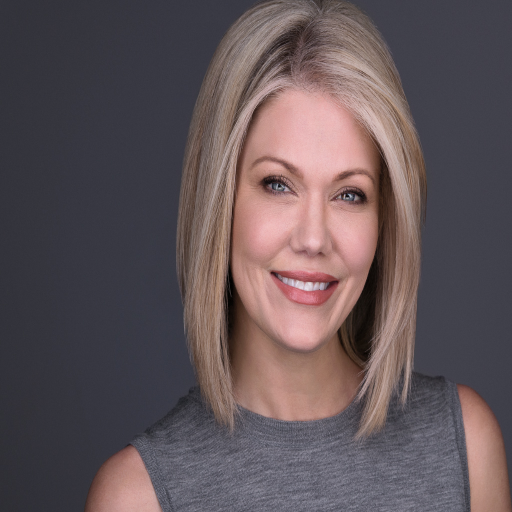

In [ ]:
ori = og_image.copy()
parsing = evaluate(image_path, cp)

print(parsing)
colors = [[230, 50, 20], [20, 70, 180], [20, 70, 180]]

cv2_imshow(cv2.resize(cv2.cvtColor(og_image, cv2.COLOR_BGR2RGB), (512, 512)))

In [ ]:
skin_target = og_image

In [ ]:
skin_target = np.zeros((og_image.shape[0],og_image.shape[1],4))

In [ ]:
og_image.shape

(819, 1024, 3)

In [ ]:
skin_target.shape

(819, 1024, 4)

In [ ]:
parsing.shape

(819, 1024)

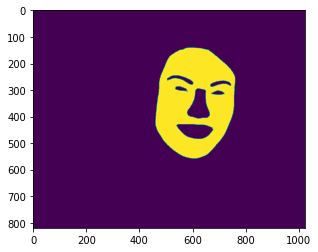

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(parsing==1)

In [ ]:
# or parsing[x][y]==14or parsing[x][y]==7

In [ ]:
for x in range(len(parsing)):
  for y in range(len(parsing[0])):
    if (parsing[x][y]==1 or parsing[x][y]==10 or parsing[x][y]==14or parsing[x][y]==7):
      skin_target[x][y][0]=og_image[x][y][0]
      skin_target[x][y][1]=og_image[x][y][1]
      skin_target[x][y][2]=og_image[x][y][2]
      skin_target[x][y][3]=255
    else:
      skin_target[x][y][3]=0
      skin_target[x][y][0]=0
      skin_target[x][y][1]=0
      skin_target[x][y][2]=0

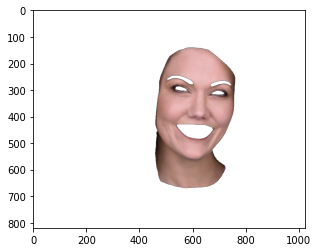

In [ ]:
plt.imshow(skin_target/255)

## SKIN SOURCE

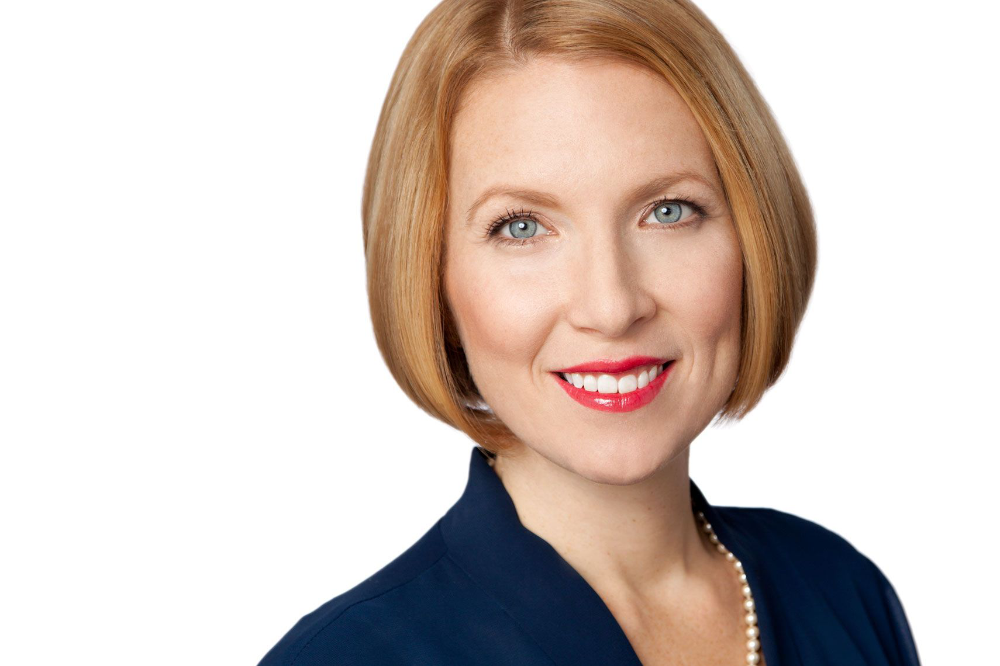

In [ ]:
from PIL import Image
# 1  face
# 11 teeth
# 12 upper lip
# 13 lower lip
# 17 hair


table = {
    'hair': 17,
    'upper_lip': 12,
    'lower_lip': 13
}


cp = 'cp/79999_iter.pth'

# image = cv2.imread(image_path)

# #image=data
# image_path="../segmented face/segmentedgirl5.png"
image_path="../original face/girl18.jpg"

image = Image.open(image_path)
# convert image to numpy array
og_image = np.array(image)
image

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


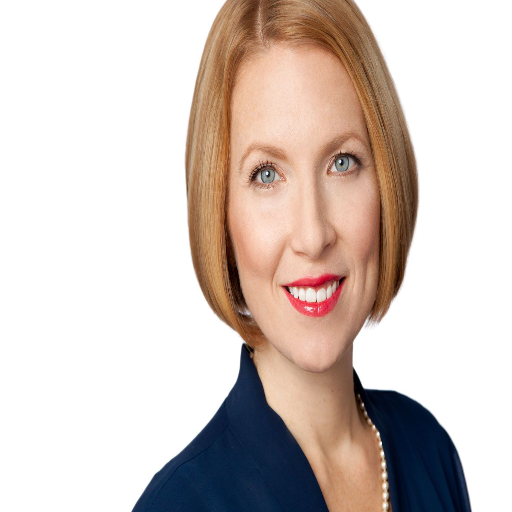

In [ ]:


ori = og_image.copy()
parsing = evaluate(image_path, cp)

print(parsing)
colors = [[230, 50, 20], [20, 70, 180], [20, 70, 180]]
cv2_imshow(cv2.resize(cv2.cvtColor(og_image, cv2.COLOR_BGR2RGB), (512, 512)))

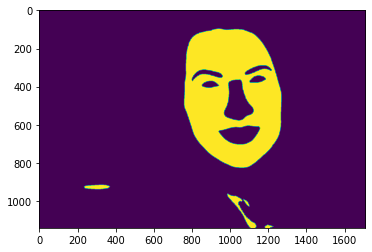

In [ ]:
plt.imshow(parsing==1)

In [ ]:
skin_source = og_image

In [ ]:
skin_source = np.zeros((og_image.shape[0],og_image.shape[1],4))

In [ ]:
#parsing[x][y]==3
#parsing[x][y]==3 or parsing[x][y]==2
for x in range((skin_source.shape[0])):
  for y in range((skin_source.shape[1])):
    if (parsing[x][y]==1 or parsing[x][y]==10):
      skin_source[x][y][0]=og_image[x][y][0]
      skin_source[x][y][1]=og_image[x][y][1]
      skin_source[x][y][2]=og_image[x][y][2]
      skin_source[x][y][3]=255
    else:
      skin_source[x][y][3]=0
      skin_source[x][y][0]=0
      skin_source[x][y][1]=0
      skin_source[x][y][2]=0

In [ ]:
skin_source

array([[[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       ...,

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0.

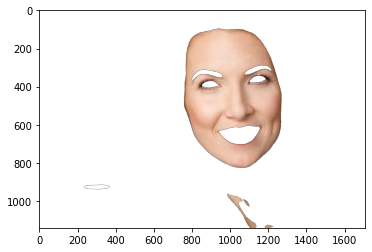

In [ ]:
plt.imshow(skin_source/255)

## Color SKIN

In [ ]:
%matplotlib inline

import sys
import numpy as np
import scipy as sp
import pandas as pd
import seaborn as sns
import matplotlib as mpl
import matplotlib.pyplot as plt
import logging

from collections import OrderedDict
from itertools import combinations
from IPython.core.debugger import set_trace

logging.basicConfig(level=logging.DEBUG)

In [ ]:
def colour_transfer_IDT(I0=None,I1=None,nb_iterations=None,*args,**kwargs):
    #varargin = colour_transfer_IDT.varargin
    #nargin = colour_transfer_IDT.nargin

    if (I0.ndim != 3):
        error('pictures must have 3 dimensions')
    
    nb_channels=np.shape(I0)[2]
# colour_transfer_IDT.m:23
    ## reshape images as 3xN matrices

    D0 = np.zeros((3, np.dot(len(I0),len(I0[0]))))
    D1 = np.zeros((3, np.dot(len(I1),len(I1[0]))))
    for i in range(0,3):
        print("here")

        D0[i,:]=np.reshape(I0[:,:,i],np.dot(len(I0),len(I0[0])), order="F")
# colour_transfer_IDT.m:27
        D1[i,:]=np.reshape(I1[:,:,i],np.dot(len(I1),len(I1[0])), order="F")
# colour_transfer_IDT.m:28
    
    ## building a sequence of (almost) random projections
#
    R = np.zeros((nb_iterations,6,3))
    R[0]=np.array([[1,0,0],[0,1,0],[0,0,1],[2 / 3,2 / 3,- 1 / 3],[2 / 3,- 1 / 3,2 / 3],[- 1 / 3,2 / 3,2 / 3]])
    # colour_transfer_IDT.m:34
    for i in range(1,nb_iterations):
        R[i]=np.dot(R[0],sp.linalg.orth(np.random.randn(3,3)))

    DR=pdf_transfer(D0,D1,R)
# colour_transfer_IDT.m:41
    ## reshape the resulting 3xN matrix as an image
    IR=I0.copy()
# colour_transfer_IDT.m:44
    for i in range(0,3):
        IR[:,:,i]=np.reshape(DR[i,:],(len(IR),len(IR[0])), order="F")

    return IR

In [ ]:

def pdf_transfer(D0=None,D1=None,Rotations=None,*args,**kwargs):
    prompt=''
    eps = 1e-6
# pdf_transfer.m:34
    for it in range(0,nb_iterations):
# pdf_transfer.m:38
        #fprintf(prompt)
        R=Rotations[it]
# pdf_transfer.m:41
        print("it.    " ,it)
        nb_projs=len(R)
# pdf_transfer.m:42
        
        D0R=np.dot(R,D0)
# pdf_transfer.m:46
        D1R=np.dot(R,D1)
# pdf_transfer.m:47
        D0R_=np.zeros(D0R.shape)

        
# pdf_transfer.m:48
        for i in range(0,nb_projs):
            # if(i==3):
            #   break;
            # get the data range
            print("i         ",i)

            datamin=min(np.concatenate((D0R[i,:],D1R[i,:]))) - eps
# pdf_transfer.m:53
            datamax=max(np.concatenate((D0R[i,:],D1R[i,:]))) + eps
# pdf_transfer.m:54
            # u=np.arange(1,(301)) / (301)*(datamax - datamin) + datamin
            # u_edge=np.arange(1,(301)) / (301)*(datamax - datamin)
            print("datamax ", datamax)
            print("datamin ", datamin)
            u=(np.arange(0,(300))/(300-1))*(datamax - datamin) + datamin
            u_edge=(np.arange(-0.5,300.5,1)/(300.5-1))*(datamax - datamin)+ datamin
            print("max u_edge ", max(u_edge))
            print("min u_edge ", min(u_edge))
            print("max u ", max(u))
            print("min u ", min(u))
# pdf_transfer.m:55
            p0R,bins1,patches=plt.hist(D0R[i,:],bins = u_edge)
            print("is my bin edge same as u_edge?",u_edge == bins1)
            print("_before  pdf_transfer1D_")
# pdf_transfer.m:58
            #p1R=plt.hist(D1R[i,:],u)
            p1R,bins2,patches2=plt.hist(D1R[i,:],bins = u_edge)
# pdf_transfer.m:59
            f=pdf_transfer1D(p0R,p1R,bins1.size,bins2.size)
# pdf_transfer.m:62
            #u=np.arange(0,(300)) / (300)*(datamax - datamin) + datamin
            
            newfun = sp.interpolate.interp1d(x = u, y = f.T,kind='linear')
            
            # print("I DID IT")
            x= D0R[i,:]
            print("max x ", max(x))
            print("min x ", min(x))
            print(" after interp1d")
            newy  = newfun(x)
            D0R_[i,:]=( newy - 1) /(300-1)*(datamax-datamin) + datamin;
            # D0R_[i,:]=np.interp(D0R[i,:],edges[1:],f.T)/(300-1)*(datamax-datamin) + datamin;
            # print("))))")
            # D0R_[i,:]=np.dot((interp1(u,f.T,D0R[i,:]) - 1) / (300 - 1),(datamax - datamin)) + datamin
# pdf_transfer.m:65
        # print("DO ",D0.shape)
        # print("D0R_ ", D0R_.shape)
        # print("D0R ", D0R_.shape)
        # print("R ",R.shape)
        lin, residuals, rank, s = np.linalg.lstsq(R,(D0R_ - D0R))
        print("lin", lin.shape)
        D0=relaxation * lin + D0
# pdf_transfer.m:68
    
    
    DR=D0.copy()
# pdf_transfer.m:74
    return DR
    

    
    # 1D - PDF Transfer
    
def pdf_transfer1D(pX=None,pY=None,bins=None,bins2=None,*args,**kwargs):
    #varargin = pdf_transfer1D.varargin
    #nargin = pdf_transfer1D.nargin
    print("in pdf_transfer1D")
    nbins=bins
    #print(pX)
# pdf_transfer.m:82
    eps=[1e-06]
    x = pX+eps
    PX=x.cumsum()
# pdf_transfer.m:86
    PX=PX / PX[-1]
# pdf_transfer.m:87
    y = pY + eps
    PY=y.cumsum()
# pdf_transfer.m:89
    PY=PY / PY[-1]
    print("PX min ", min(PX))
    print("PX max ", max(PX))

    print("PY min ", min(PY))
    print("PY max ", max(PY))

    f=sp.interpolate.interp1d(x = PY, y=np.arange(0,nbins-1),kind='linear',fill_value="extrapolate")
    b=f(PX)
    print(b.size)
    #f=interp1(PY,np.arange(0,nbins - 1),PX,'linear')
# pdf_transfer.m:94
    b[PX <= PY[0]]=0
# pdf_transfer.m:95
    b[PX >= PY[-1]]=nbins - 1
# pdf_transfer.m:96
    if sum(np.isnan(b)) > 0:
        error('colour_transfer:pdf_transfer:NaN','pdf_transfer has generated NaN values')
    print("out pdf_transfer1D")
    
    return b
    


In [ ]:
# I1 = plt.imread('purplehair.jpeg')/255
# #I1 = plt.imread('hair.jpg')/255
I1 = skin_source/255
I0 = skin_target/255
# I1 = hair_source
# I0 = hair_target
relaxation=1
nb_iterations=10

here
here
here
it.     0
i          0
datamax  1.000001
datamin  -1e-06
max u_edge  1.000001
min u_edge  -0.0016704524207011684
max u  1.000001
min u  -1e-06
is my bin edge same as u_edge? [ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:72: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.


(3, 838656)
it.     1
i          0
datamax  1e-06
datamin  -0.9158682277534893
max u_edge  1.0000000000287557e-06
min u_edge  -0.917397224794814
max u  1.0000000000287557e-06
min u  -0.9158682277534893
is my bin edge same as u_edge? [ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True 

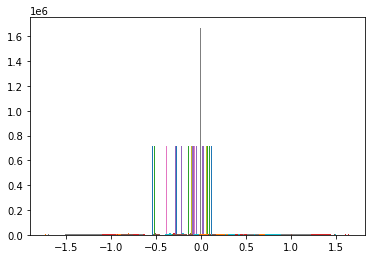

In [ ]:
import time
start_time = time.time()
IR_idt=colour_transfer_IDT(I0,I1,10)
print("--- %s seconds ---" % (time.time() - start_time))

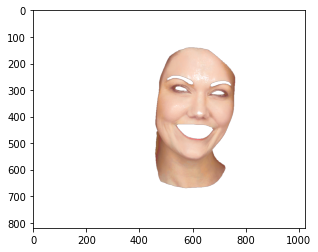

In [ ]:
plt.imshow(IR_idt)

In [ ]:
image_path="../original face/image/36.jpg"

In [ ]:
cp2= IR_idt

In [ ]:
type(cp2[0][0][0])

numpy.float64

In [ ]:
og = np.asarray(plt.imread(image_path),dtype=np.float64)

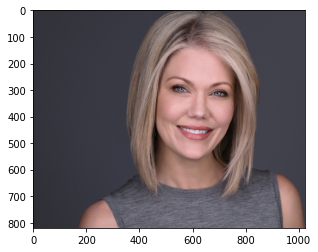

In [ ]:
og = og/255
plt.imshow(og)

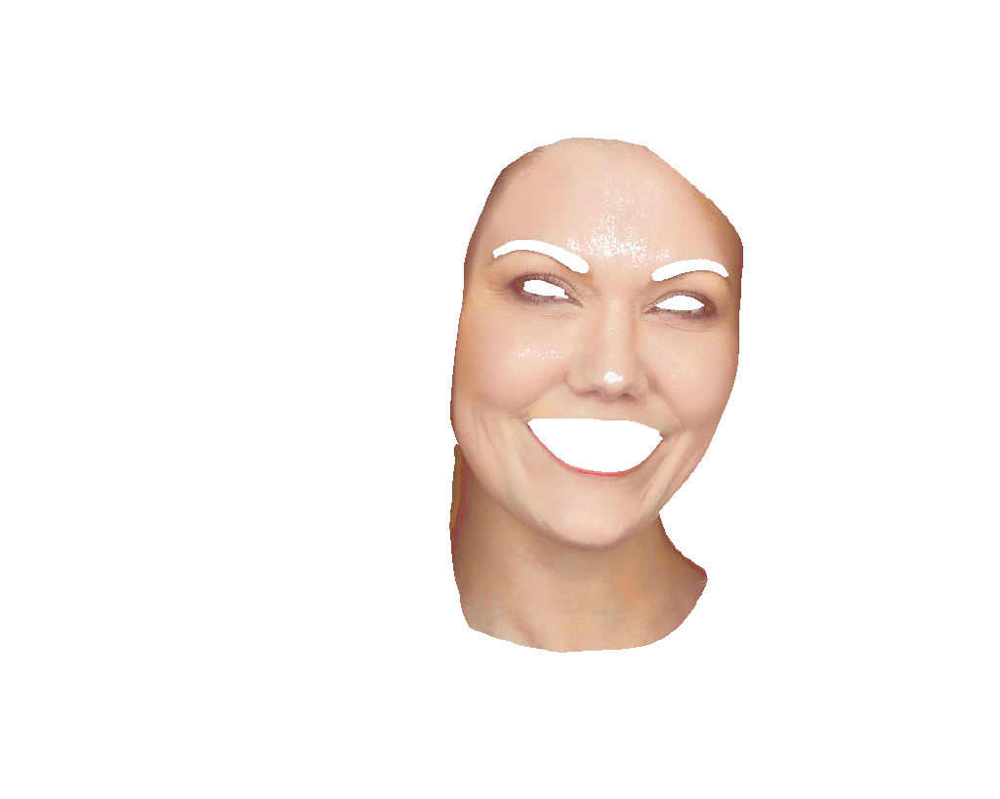

In [ ]:
 from skimage import img_as_ubyte

img2 = img_as_ubyte(cp2/np.max(cp2))
Image.fromarray(img2)

In [ ]:
from PIL import Image
import numpy as np
# load the image
#image = cv2.imread(image_path)

og2 = og
cp2= IR_idt
for x in range(IR_idt.shape[0]):
  for y in range(IR_idt.shape[1]):
    if (cp2[x,y,3]==1.0):
      og2[x,y,0]=cp2[x,y,0]
      og2[x,y,1]=cp2[x,y,1]
      og2[x,y,2]=cp2[x,y,2]
      #og2[x,y,3]=1
      # new[x][y][3]=255

In [ ]:
np.max(og2)

1.0274191112331716

In [ ]:
from skimage import img_as_ubyte

img_skin = img_as_ubyte(og2/np.max(og2))

In [ ]:
#SKIN
img2_skin = Image.fromarray(img_skin)

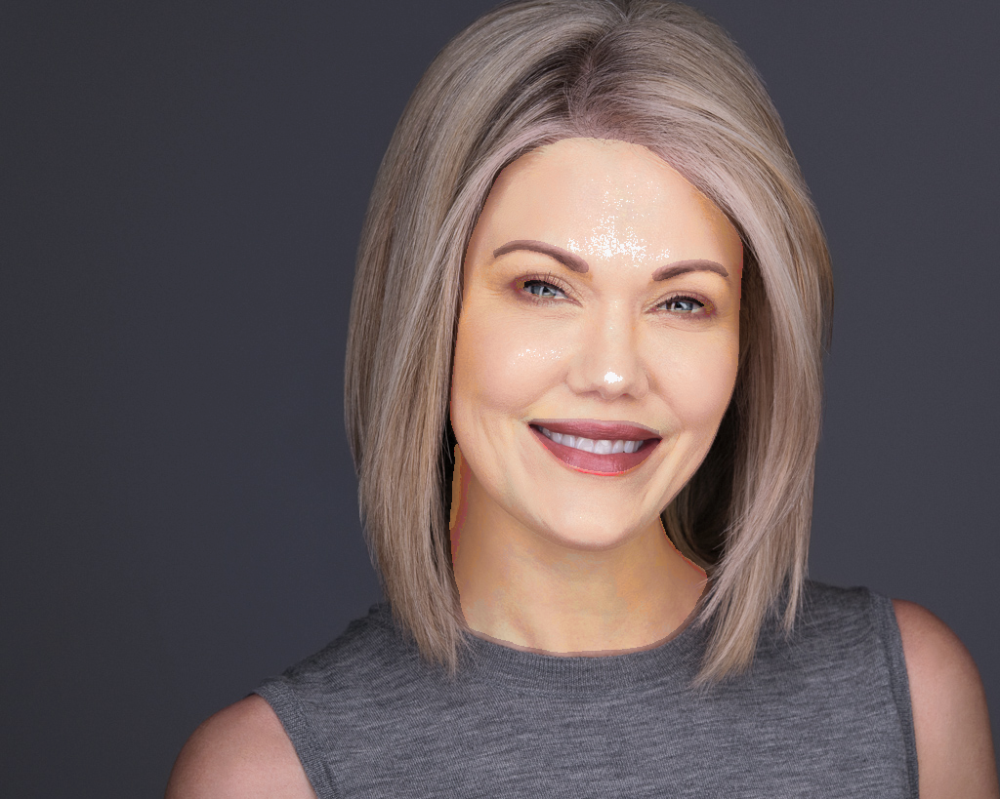

In [ ]:
img2_skin

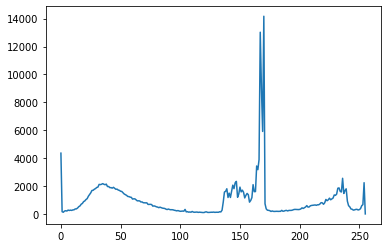

In [ ]:
histr = cv2.calcHist([img_skin],[0],None,[256],[0,256]) 
  
# show the plotting graph of an image 
plt.plot(histr) 

plt.savefig("../result_face/11_30_result_HIST.jpg")
plt.show() 

In [ ]:
og_hist = cv2.imread(image_path,0) 

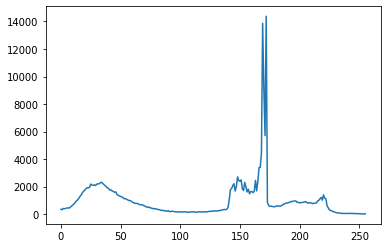

In [ ]:
histr = cv2.calcHist([og_hist],[0],None,[256],[0,256]) 
  
# show the plotting graph of an image 
plt.plot(histr) 
plt.savefig("../result_face/30_hist.jpg")
plt.show() 

## LIP edits

### LIP TARGET

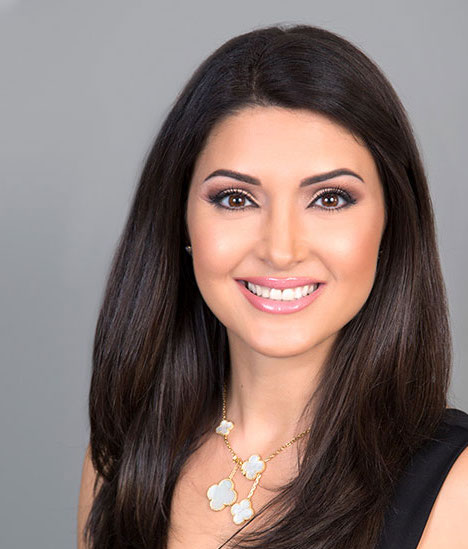

In [ ]:
from PIL import Image
# 1  face
# 11 teeth
# 12 upper lip
# 13 lower lip
# 17 hair


table = {
    'hair': 17,
    'upper_lip': 12,
    'lower_lip': 13
}


cp = 'cp/79999_iter.pth'

# image = cv2.imread(image_path)

# #image=data
image_path="../original face/image/30_.jpg"
image = Image.open(image_path)
# convert image to numpy array
og_image = np.array(image)
image

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


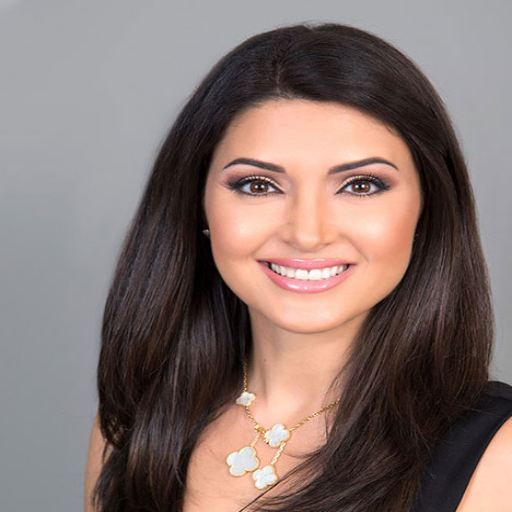

In [ ]:
ori = og_image.copy()
parsing = evaluate(image_path, cp)

print(parsing)
colors = [[230, 50, 20], [20, 70, 180], [20, 70, 180]]

cv2_imshow(cv2.resize(cv2.cvtColor(og_image, cv2.COLOR_BGR2RGB), (512, 512)))

In [ ]:
lip_target = og_image

In [ ]:
lip_target = np.zeros((og_image.shape[0],og_image.shape[1],4))

In [ ]:
og_image.shape

(549, 468, 3)

In [ ]:
lip_target.shape

(549, 468, 4)

In [ ]:
parsing.shape

(549, 468)

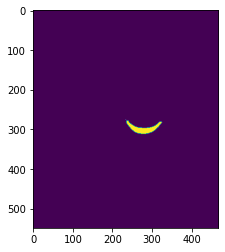

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(parsing==13)

In [ ]:
# for x in range(len(parsing)):
#   for y in range(len(parsing[0])):
#     if (parsing[x][y]==12 or parsing[x][y]==13):
#       lip_target[x][y][0]=og_image[x][y][0]
#       lip_target[x][y][1]=og_image[x][y][1]
#       lip_target[x][y][2]=og_image[x][y][2]
#       lip_target[x][y][3]=255
#     else:
#       lip_target[x][y][3]=0

In [ ]:
lip_target12 = np.zeros((og_image.shape[0],og_image.shape[1],4))
lip_target13 = np.zeros((og_image.shape[0],og_image.shape[1],4))
for x in range(len(parsing)):
  for y in range(len(parsing[0])):
    if (parsing[x][y]==12):
      lip_target12[x][y][0]=og_image[x][y][0]
      lip_target12[x][y][1]=og_image[x][y][1]
      lip_target12[x][y][2]=og_image[x][y][2]
      lip_target12[x][y][3]=255
    else:
      lip_target12[x][y][3]=0

for x in range(len(parsing)):
  for y in range(len(parsing[0])):
    if (parsing[x][y]==13):
      lip_target13[x][y][0]=og_image[x][y][0]
      lip_target13[x][y][1]=og_image[x][y][1]
      lip_target13[x][y][2]=og_image[x][y][2]
      lip_target13[x][y][3]=255
    else:
      lip_target13[x][y][3]=0

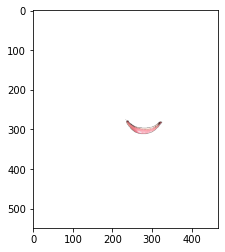

In [ ]:
plt.imshow(lip_target13/255)

### LIP SOURCE

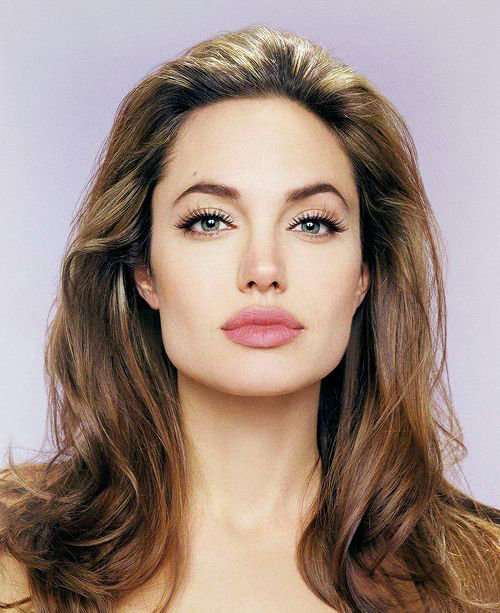

In [ ]:
from PIL import Image
# 1  face
# 11 teeth
# 12 upper lip
# 13 lower lip
# 17 hair


table = {
    'hair': 17,
    'upper_lip': 12,
    'lower_lip': 13
}


cp = 'cp/79999_iter.pth'

# image = cv2.imread(image_path)

# #image=data
# image_path="../segmented face/segmentedgirl5.png"
image_path="../original face/image/11.jpg"


image = Image.open(image_path)
# convert image to numpy array
og_image = np.array(image)
image

[[ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 ...
 [17 17 17 ... 17 17 17]
 [17 17 17 ... 17 17 17]
 [17 17 17 ... 17 17 17]]


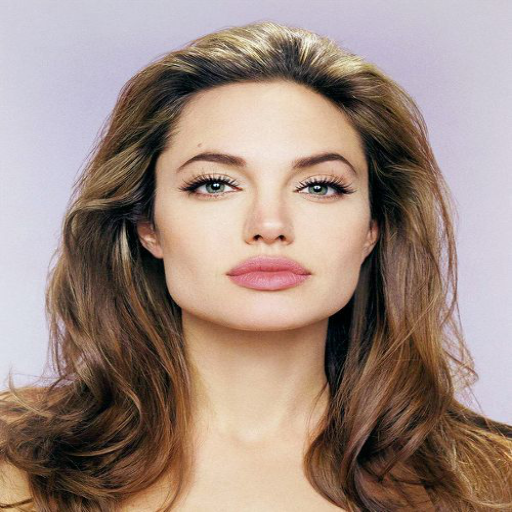

In [ ]:
ori = og_image.copy()
parsing = evaluate(image_path, cp)

print(parsing)
colors = [[230, 50, 20], [20, 70, 180], [20, 70, 180]]
cv2_imshow(cv2.resize(cv2.cvtColor(og_image, cv2.COLOR_BGR2RGB), (512, 512)))

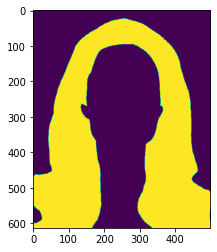

In [ ]:
plt.imshow(parsing==17)

In [ ]:
lip_source = og_image

In [ ]:
lip_source = np.zeros((og_image.shape[0],og_image.shape[1],4))

In [ ]:
# for x in range((lip_source.shape[0])):
#   for y in range((lip_source.shape[1])):
#     if (parsing[x][y]==12 or parsing[x][y]==13):
#       lip_source[x][y][0]=og_image[x][y][0]
#       lip_source[x][y][1]=og_image[x][y][1]
#       lip_source[x][y][2]=og_image[x][y][2]
#       lip_source[x][y][3]=255
#     else:
#       lip_source[x][y][3]=0

In [ ]:
lip_source12 = np.zeros((og_image.shape[0],og_image.shape[1],4))
lip_source13 = np.zeros((og_image.shape[0],og_image.shape[1],4))
for x in range(len(parsing)):
  for y in range(len(parsing[0])):
    if (parsing[x][y]==12):
      lip_source12[x][y][0]=og_image[x][y][0]
      lip_source12[x][y][1]=og_image[x][y][1]
      lip_source12[x][y][2]=og_image[x][y][2]
      lip_source12[x][y][3]=255
    else:
      lip_source12[x][y][3]=0

for x in range(len(parsing)):
  for y in range(len(parsing[0])):
    if (parsing[x][y]==13):
      lip_source13[x][y][0]=og_image[x][y][0]
      lip_source13[x][y][1]=og_image[x][y][1]
      lip_source13[x][y][2]=og_image[x][y][2]
      lip_source13[x][y][3]=255
    else:
      lip_source13[x][y][3]=0

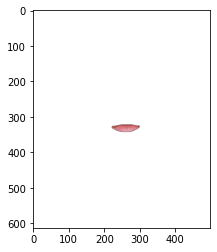

In [ ]:
plt.imshow(lip_source13/255)

### Color LIPS

here
here
here
it.     0
i          0
datamax  1.000001
datamin  -1e-06
max u_edge  1.000001
min u_edge  -0.0016704524207011684
max u  1.000001
min u  -1e-06
is my bin edge same as u_edge? [ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:72: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.


Streaming output truncated to the last 5000 lines.
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True


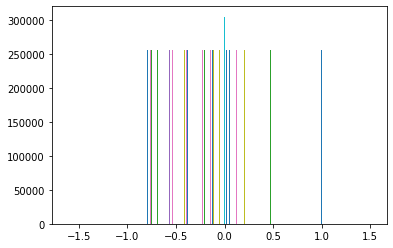

In [ ]:
I112 = lip_source12/255
I012 = lip_target12/255

relaxation=1
nb_iterations=10

start_time = time.time()
IR_idt12=colour_transfer_IDT(I012,I112,10)

I113 = lip_source13/255
I013 = lip_target13/255

relaxation=1
nb_iterations=10
IR_idt13=colour_transfer_IDT(I013,I113,10)
print("--- %s seconds ---" % (time.time() - start_time))

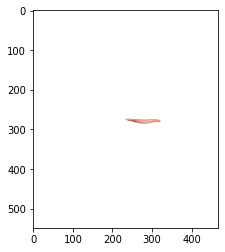

In [ ]:
plt.imshow(IR_idt12)

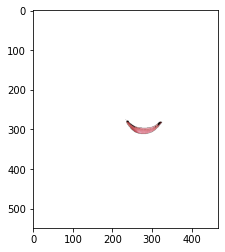

In [ ]:
plt.imshow(IR_idt13)

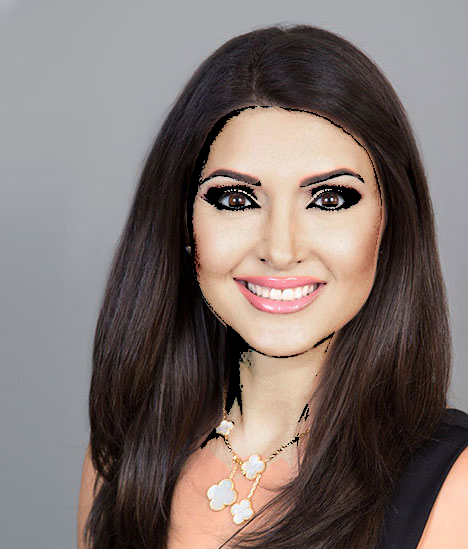

In [ ]:
img2_skin

In [ ]:
og2 = img_skin/255

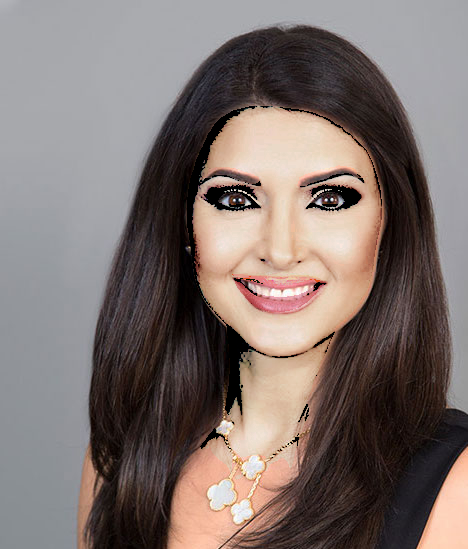

In [ ]:
#BOTH LIPS
from PIL import Image
import numpy as np
from skimage import img_as_ubyte

cp12= IR_idt12
cp13 = IR_idt13
for x in range(IR_idt12.shape[0]):
  for y in range(IR_idt12.shape[1]):
    if (cp12[x,y,3]==1.0):
      og2[x,y,0]=cp12[x,y,0]
      og2[x,y,1]=cp12[x,y,1]
      og2[x,y,2]=cp12[x,y,2]
    if (cp13[x,y,3]==1.0):
      og2[x,y,0]=cp13[x,y,0]
      og2[x,y,1]=cp13[x,y,1]
      og2[x,y,2]=cp13[x,y,2]


img_lips = img_as_ubyte(og2/np.max(og2))
img1213_lips= Image.fromarray(img_lips)
img1213_lips

## Eyebrow edits

### EYEBROW TARGET

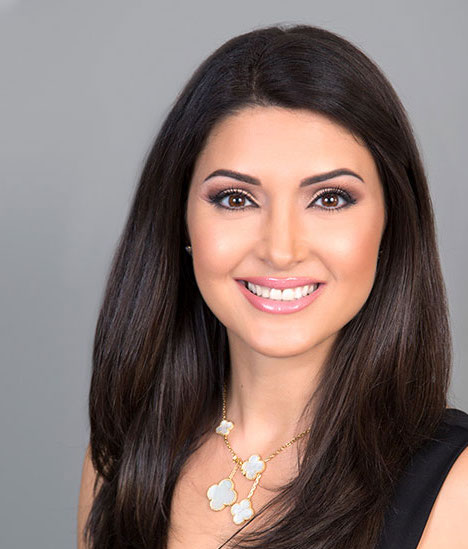

In [ ]:
from PIL import Image
# 1  face
# 11 teeth
# 12 upper lip
# 13 lower lip
# 17 hair


table = {
    'hair': 17,
    'upper_lip': 12,
    'lower_lip': 13
}


cp = 'cp/79999_iter.pth'

# image = cv2.imread(image_path)

# #image=data
image_path="../original face/image/30_.jpg"
image = Image.open(image_path)
# convert image to numpy array
og_image = np.array(image)
image

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


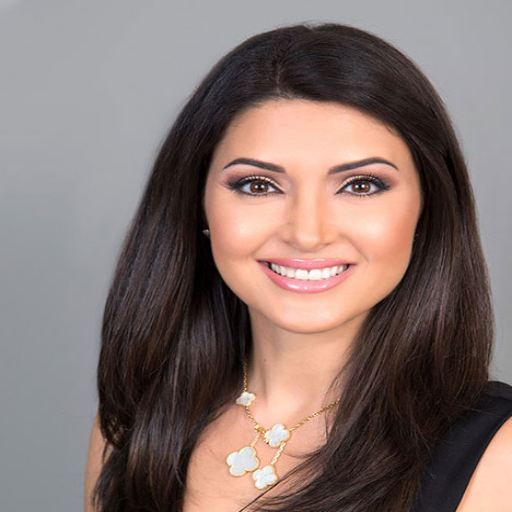

In [ ]:
ori = og_image.copy()
parsing = evaluate(image_path, cp)

print(parsing)
colors = [[230, 50, 20], [20, 70, 180], [20, 70, 180]]

cv2_imshow(cv2.resize(cv2.cvtColor(og_image, cv2.COLOR_BGR2RGB), (512, 512)))

In [ ]:
eyebrow_target = og_image

In [ ]:
eyebrow_target = np.zeros((og_image.shape[0],og_image.shape[1],4))

In [ ]:
og_image.shape

(549, 468, 3)

In [ ]:
eyebrow_target.shape

(549, 468, 4)

In [ ]:
parsing.shape

(549, 468)

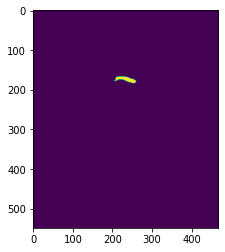

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(parsing==3)

In [ ]:
for x in range(len(parsing)):
  for y in range(len(parsing[0])):
    if (parsing[x][y]==2 or parsing[x][y]==3):
      eyebrow_target[x][y][0]=og_image[x][y][0]
      eyebrow_target[x][y][1]=og_image[x][y][1]
      eyebrow_target[x][y][2]=og_image[x][y][2]
      eyebrow_target[x][y][3]=255
    else:
      eyebrow_target[x][y][3]=0
      eyebrow_target[x][y][0]=0
      eyebrow_target[x][y][1]=0
      eyebrow_target[x][y][2]=0

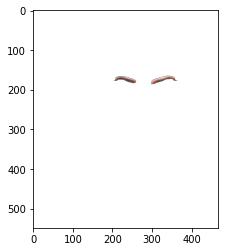

In [ ]:
plt.imshow(eyebrow_target/255)

### EYEBROW SOURCE

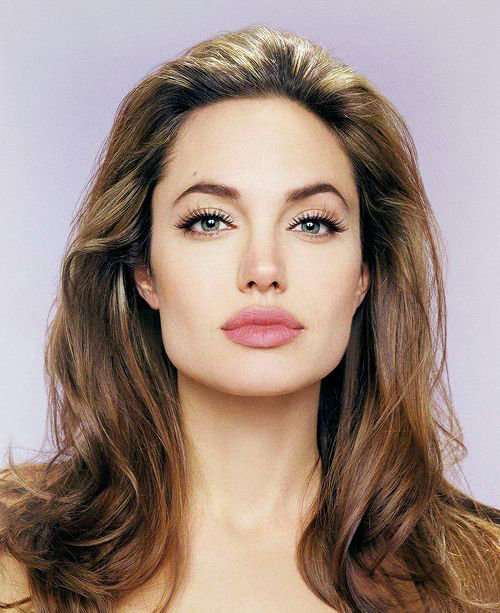

In [ ]:
from PIL import Image
# 1  face
# 11 teeth
# 12 upper lip
# 13 lower lip
# 17 hair


table = {
    'hair': 17,
    'upper_lip': 12,
    'lower_lip': 13
}


cp = 'cp/79999_iter.pth'

# image = cv2.imread(image_path)

# #image=data
# image_path="../segmented face/segmentedgirl5.png"
image_path="../original face/image/11.jpg"

image = Image.open(image_path)
# convert image to numpy array
og_image = np.array(image)
image

[[ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 ...
 [17 17 17 ... 17 17 17]
 [17 17 17 ... 17 17 17]
 [17 17 17 ... 17 17 17]]


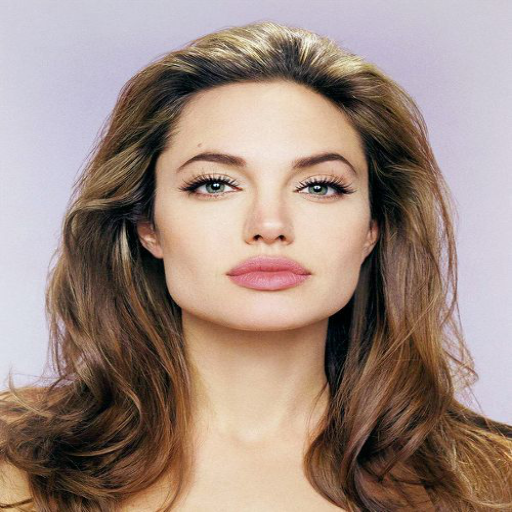

In [ ]:


ori = og_image.copy()
parsing = evaluate(image_path, cp)

print(parsing)
colors = [[230, 50, 20], [20, 70, 180], [20, 70, 180]]
cv2_imshow(cv2.resize(cv2.cvtColor(og_image, cv2.COLOR_BGR2RGB), (512, 512)))

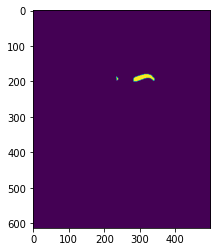

In [ ]:
plt.imshow(parsing==2)

In [ ]:
eyebrow_source = og_image

In [ ]:
eyebrow_source = np.zeros((og_image.shape[0],og_image.shape[1],4))

In [ ]:
#parsing[x][y]==3
#parsing[x][y]==3 or parsing[x][y]==2
for x in range((eyebrow_source.shape[0])):
  for y in range((eyebrow_source.shape[1])):
    if (parsing[x][y]==3 or parsing[x][y]==2):
      eyebrow_source[x][y][0]=og_image[x][y][0]
      eyebrow_source[x][y][1]=og_image[x][y][1]
      eyebrow_source[x][y][2]=og_image[x][y][2]
      eyebrow_source[x][y][3]=255
    else:
      eyebrow_source[x][y][3]=0
      eyebrow_source[x][y][0]=0
      eyebrow_source[x][y][1]=0
      eyebrow_source[x][y][2]=0

In [ ]:
eyebrow_source

array([[[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       ...,

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.]],

       [[0., 0., 0., 0.],
        [0., 0., 0., 0.],
        [0., 0., 0., 0.],
        ...,
        [0., 0., 0., 0.],
        [0., 0.

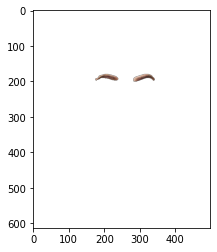

In [ ]:
plt.imshow(eyebrow_source/255)

### Color EYEBROWS

In [ ]:
# I1 = plt.imread('purplehair.jpeg')/255
# #I1 = plt.imread('hair.jpg')/255
I1 = eyebrow_source/255
I0 = eyebrow_target/255
# I1 = hair_source
# I0 = hair_target
relaxation=1
nb_iterations=10

here
here
here
it.     0
i          0
datamax  1.000001
datamin  -1e-06
max u_edge  1.000001
min u_edge  -0.0016704524207011684
max u  1.000001
min u  -1e-06
is my bin edge same as u_edge? [ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:72: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.


min x  0.0
 after interp1d
lin (3, 256932)
it.     1
i          0
datamax  1e-06
datamin  -0.481598898254516
max u_edge  9.999999999732445e-07
min u_edge  -0.48240290476245345
max u  9.999999999732445e-07
min u  -0.481598898254516
is my bin edge same as u_edge? [ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  

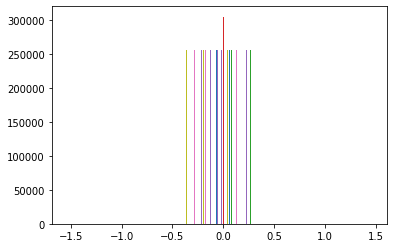

In [ ]:
import time
start_time = time.time()
IR_idt=colour_transfer_IDT(I0,I1,10)
print("--- %s seconds ---" % (time.time() - start_time))

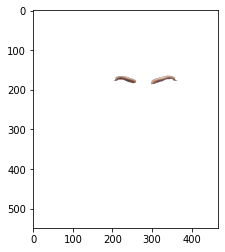

In [ ]:
plt.imshow(IR_idt)

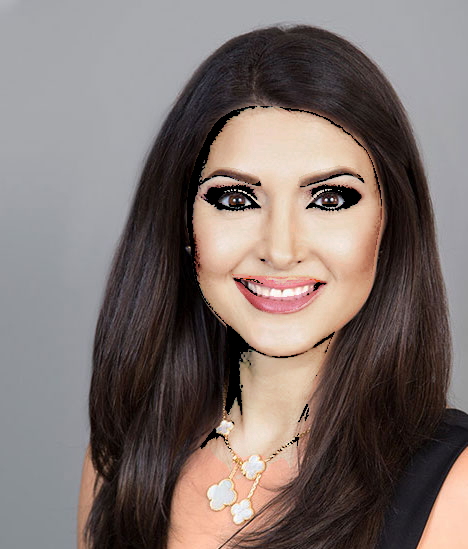

In [ ]:
from PIL import Image
import numpy as np
from skimage import img_as_ubyte
og2 = img_lips/255
cp2= IR_idt
for x in range(IR_idt.shape[0]):
  for y in range(IR_idt.shape[1]):
    if (cp2[x,y,3]==1.0):
      og2[x,y,0]=cp2[x,y,0]
      og2[x,y,1]=cp2[x,y,1]
      og2[x,y,2]=cp2[x,y,2]

img_eyebrows = img_as_ubyte(og2/np.max(og2))
img2_eyebrows = Image.fromarray(img_eyebrows)
img2_eyebrows

## Hair edits

### HAIR TARGET

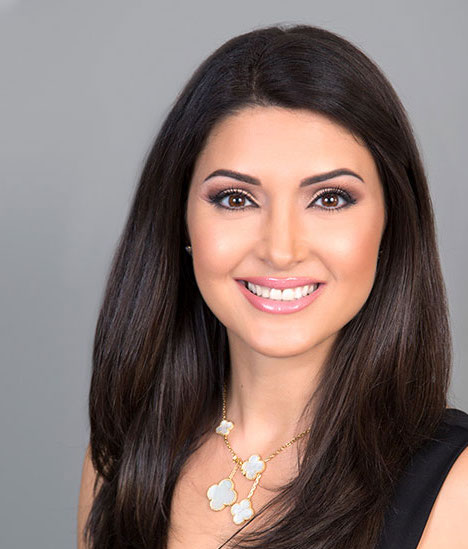

In [ ]:
from PIL import Image
# 1  face
# 11 teeth
# 12 upper lip
# 13 lower lip
# 17 hair


table = {
    'hair': 17,
    'upper_lip': 12,
    'lower_lip': 13
}


cp = 'cp/79999_iter.pth'

# image = cv2.imread(image_path)

# #image=data
image_path="../original face/image/30_.jpg"
image = Image.open(image_path)
# convert image to numpy array
og_image = np.array(image)
image

[[0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 ...
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]
 [0 0 0 ... 0 0 0]]


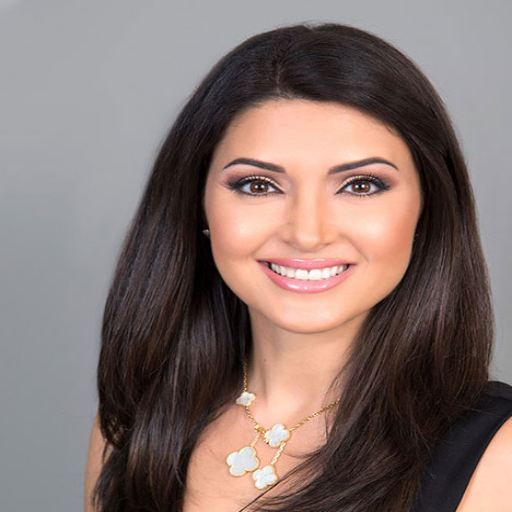

In [ ]:
ori = og_image.copy()
parsing = evaluate(image_path, cp)

print(parsing)
colors = [[230, 50, 20], [20, 70, 180], [20, 70, 180]]

cv2_imshow(cv2.resize(cv2.cvtColor(og_image, cv2.COLOR_BGR2RGB), (512, 512)))

In [ ]:
hair_target = og_image

In [ ]:
hair_target = np.zeros((og_image.shape[0],og_image.shape[1],4))

In [ ]:
og_image.shape

(549, 468, 3)

In [ ]:
hair_target.shape

(549, 468, 4)

In [ ]:
parsing.shape

(549, 468)

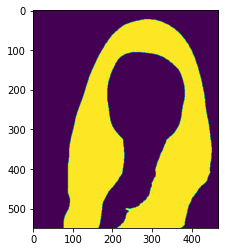

In [ ]:
import matplotlib.pyplot as plt
plt.imshow(parsing==17)

In [ ]:
for x in range(len(parsing)):
  for y in range(len(parsing[0])):
    if (parsing[x][y]==17):
      hair_target[x][y][0]=og_image[x][y][0]
      hair_target[x][y][1]=og_image[x][y][1]
      hair_target[x][y][2]=og_image[x][y][2]
      hair_target[x][y][3]=255
    else:
      hair_target[x][y][3]=0

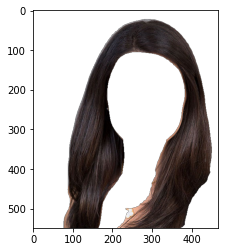

In [ ]:
plt.imshow(hair_target/255)

### HAIR SOURCE

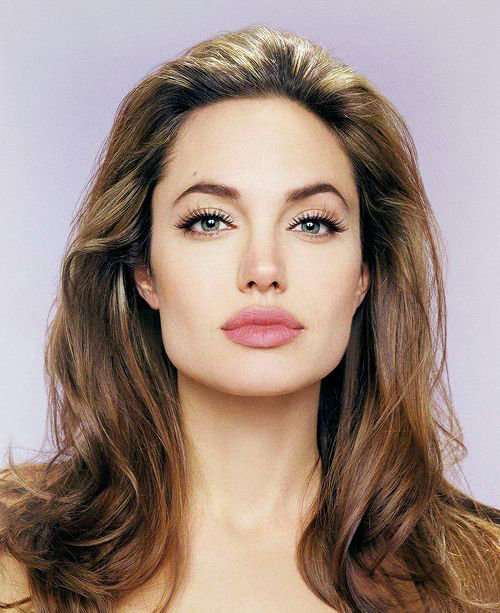

In [ ]:
from PIL import Image
# 1  face
# 11 teeth
# 12 upper lip
# 13 lower lip
# 17 hair


table = {
    'hair': 17,
    'upper_lip': 12,
    'lower_lip': 13
}


cp = 'cp/79999_iter.pth'

# image = cv2.imread(image_path)

# #image=data
# image_path="../segmented face/segmentedgirl5.png"
image_path="../original face/image/11.jpg"

image = Image.open(image_path)
# convert image to numpy array
og_image = np.array(image)
image

[[ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 [ 0  0  0 ...  0  0  0]
 ...
 [17 17 17 ... 17 17 17]
 [17 17 17 ... 17 17 17]
 [17 17 17 ... 17 17 17]]


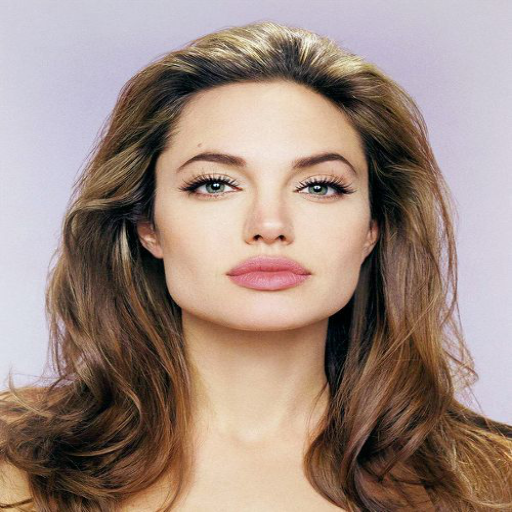

In [ ]:
ori = og_image.copy()
parsing = evaluate(image_path, cp)

print(parsing)
colors = [[230, 50, 20], [20, 70, 180], [20, 70, 180]]
cv2_imshow(cv2.resize(cv2.cvtColor(og_image, cv2.COLOR_BGR2RGB), (512, 512)))

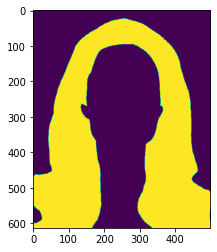

In [ ]:
plt.imshow(parsing==17)

In [ ]:
hair_source = og_image

In [ ]:

hair_source = np.zeros((og_image.shape[0],og_image.shape[1],4))

In [ ]:
for x in range((hair_source.shape[0])):
  for y in range((hair_source.shape[1])):
    if (parsing[x][y]==17):
      hair_source[x][y][0]=og_image[x][y][0]
      hair_source[x][y][1]=og_image[x][y][1]
      hair_source[x][y][2]=og_image[x][y][2]
      hair_source[x][y][3]=255
    else:
      hair_source[x][y][3]=0

In [ ]:
hair_source.shape

(613, 500, 4)

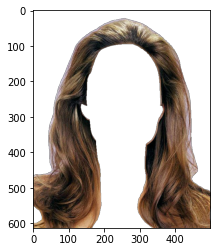

In [ ]:
plt.imshow(hair_source/255)

### Color HAIR

In [ ]:
# I1 = plt.imread('purplehair.jpeg')/255
# #I1 = plt.imread('hair.jpg')/255
I1 =hair_source /255
I0 = hair_target/255
# I1 = hair_source
# I0 = hair_target
relaxation=1
nb_iterations=10

here
here
here
it.     0
i          0
datamax  1.000001
datamin  -1e-06
max u_edge  1.000001
min u_edge  -0.0016704524207011684
max u  1.000001
min u  -1e-06
is my bin edge same as u_edge? [ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  

/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:72: FutureWarning: `rcond` parameter will change to the default of machine precision times ``max(M, N)`` where M and N are the input matrix dimensions.
To use the future default and silence this warning we advise to pass `rcond=None`, to keep using the old, explicitly pass `rcond=-1`.


datamax  0.8509790128160845
datamin  -0.013734051007759072
max u_edge  0.8509790128160845
min u_edge  -0.015177645438182851
max u  0.8509790128160845
min u  -0.013734051007759072
is my bin edge same as u_edge? [ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True

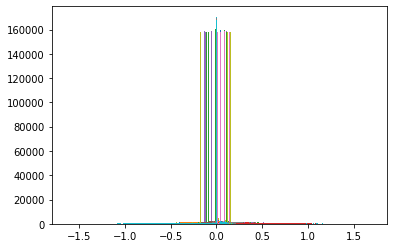

In [ ]:
import time
start_time = time.time()
IR_idt=colour_transfer_IDT(I0,I1,10)
print("--- %s seconds ---" % (time.time() - start_time))

--- 0.02654409408569336 seconds ---


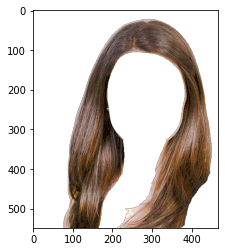

In [ ]:
import time
start_time = time.time()
plt.imshow(IR_idt)
print("--- %s seconds ---" % (time.time() - start_time))

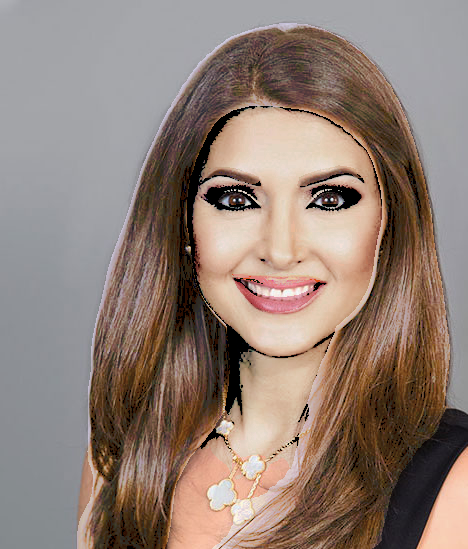

In [ ]:
from PIL import Image
import numpy as np
from skimage import img_as_ubyte
og2 = img_eyebrows/255
cp2= IR_idt
for x in range(IR_idt.shape[0]):
  for y in range(IR_idt.shape[1]):
    if (cp2[x,y,3]==1.0):
      og2[x,y,0]=cp2[x,y,0]
      og2[x,y,1]=cp2[x,y,1]
      og2[x,y,2]=cp2[x,y,2]

img_hair = img_as_ubyte(og2/np.max(og2))
img2_hair = Image.fromarray(img_hair)
img2_hair

## Result Saving

In [ ]:
img2_skin

In [ ]:
img2_skin.save("../result_face/girl18_36_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/girl_1_36_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/13_31_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/41_13_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/4_13_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/3_13_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/3_6_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/41_6_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/3_27_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/4_27_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/33_27_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/31_27_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/41_27_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/11_27_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/13_27_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/10_27_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/girl19_40_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/9_40_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/30_39_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/9_39_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/girl18_39_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/girl18_44_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/9_44_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/11_26_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/13_26_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/girl15_26_result_skin.jpg")

In [ ]:
img2_skin.save("../result_face/11_30_result_skin.jpg")

In [ ]:
img1213_lips

In [ ]:
img1213_lips.save("../result_face/girl18_36_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/girl_1_36_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/31_13_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/41_13_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/4_13_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/3_13_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/3_6_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/41_6_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/3_27_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/4_27_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/33_27_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/31_27_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/41_27_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/11_27_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/13_27_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/10_27_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/girl19_40_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/9_40_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/30_39_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/9_39_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/girl18_39_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/girl18_44_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/9_44_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/11_26_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/13_26_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/girl15_26_result_lips.jpg")

In [ ]:
img1213_lips.save("../result_face/11_30_result_lips.jpg")

In [ ]:
img2_eyebrows

In [ ]:
img2_eyebrows.save("../result_face/girl18_36_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/girl_1_36_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/31_13_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/41_13_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/4_13_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/3_13_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/3_6_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/41_6_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/3_27_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/4_27_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/33_27_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/31_27_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/41_27_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/11_27_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/13_27_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/10_27_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/girl19_40_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/9_40_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/30_39_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/9_39_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/girl18_39_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/girl18_44_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/9_44_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/11_26_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/13_26_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/girl15_26_result_eyebrows.jpg")

In [ ]:
img2_eyebrows.save("../result_face/11_30_result_eyebrows.jpg")

In [ ]:
img2_hair

In [ ]:
img2_hair.save("../result_face/girl18_36_result.jpg")

In [ ]:
img2_hair.save("../result_face/girl_1_36_result.jpg")

In [ ]:
img2_hair.save("../result_face/31_13_result.jpg")

In [ ]:
img2_hair.save("../result_face/4_13_result.jpg")

In [ ]:
img2_hair.save("../result_face/3_13_result.jpg")

In [ ]:
img2_hair.save("../result_face/3_6_result.jpg")

In [ ]:
img2_hair.save("../result_face/41_6_result.jpg")

In [ ]:
img2_hair.save("../result_face/3_27_result.jpg")

In [ ]:
img2_hair.save("../result_face/4_27_result.jpg")

In [ ]:
img2_hair.save("../result_face/33_27_result.jpg")

In [ ]:
img2_hair.save("../result_face/31_27_result.jpg")

In [ ]:
img2_hair.save("../result_face/11_27_result.jpg")

In [ ]:
img2_hair.save("../result_face/13_27_result.jpg")

In [ ]:
img2_hair.save("../result_face/10_27_result.jpg")

In [ ]:
img2_hair.save("../result_face/girl19_40_result.jpg")

In [ ]:
img2_hair.save("../result_face/9_40_result.jpg")

In [ ]:
img2_hair.save("../result_face/30_39_result.jpg")

In [ ]:
img2_hair.save("../result_face/9_39_result.jpg")

In [ ]:
img2_hair.save("../result_face/girl18_39_result.jpg")

In [ ]:
img2_hair.save("../result_face/girl18_44_result.jpg")

In [ ]:
img2_hair.save("../result_face/9_44_result.jpg")

In [ ]:
img2_hair.save("../result_face/11_26_result.jpg")

In [ ]:
img2_hair.save("../result_face/13_26_result.jpg")

In [ ]:
img2_hair.save("../result_face/girl15_26_result.jpg")

In [ ]:
img2_hair.save("../result_face/11_30_result.jpg")